In [3]:
'''this script concate each block per subject to a file wihthin subject called s103_df_concat.csv
   subsequently save a concatenante file under rechain-beh called all_df_concat.csv '''



import hdf5storage
import os
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt

import seaborn as sns


In [5]:
# global setting f
plt.rcParams.update({"font.size": 18})
colors = sns.color_palette("deep")
sns.set_theme(style="whitegrid")

In [15]:
# top level dir 
# 

PROJECT_DIR = "/data/rwchain-all/round2"
BEH_DIR = os.path.join(PROJECT_DIR, "rwchain-beh/data")
EEG_DIR = os.path.join(PROJECT_DIR, "rwchain-eeg")
ALL_BEH_DIR = os.path.join(PROJECT_DIR, 'rwchain-beh', 'combined')

list_of_subj = os.listdir(BEH_DIR)
list_of_subj.sort()
# list_of_subj = [list_of_subj[5]]

df = pd.read_pickle(os.path.join(ALL_BEH_DIR, 'all_df_concat.pkl'))

In [16]:
# organize some columsn
 
df['key'][df['key'] == '[5]'] = 1
df['key'][df['key'] == '[2]'] = 0
df['cumsum'] = df['sequence_clean'].apply(lambda x: [sum(x[:i+1]) for i in range(len(x))])

/tmp/ipykernel_1412917/1494495760.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['key'][df['key'] == '[5]'] = 1
/tmp/ipykernel_1412917/1494495760.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['key'][df['key'] == '[2]'] = 0


In [17]:

df = df[df['count'] != 0]
df = df[df['stimDur'] != 0.5]
df = df[df['stimDur'] != 0.05]
cumsum = np.array(df['cumsum'].to_list())
sequence =  np.array(df['sequence_clean'].to_list())
count = df['count'].to_numpy()

In [18]:
df

,time,bytetime,press,count,key,stimDur,Bias,sequence,block,sequence_clean,sid,cumsum
0,2.6166679859161377,2611,[1],10,0,0.25,0.12,[-1. 1. -1. 1. -1. 1. -1. -1. -1. -1. -1. ...,0,"[-1.0, 1.0, -1.0, 1.0, -1.0, 1.0, -1.0, -1.0, ...",s102,"[-1.0, 0.0, -1.0, 0.0, -1.0, 0.0, -1.0, -2.0, ..."
1,2.2499890327453613,2233,[1],8,1,0.25,0.12,[-1. -1. -1. 1. 1. 1. 1. 1. -1. -1. -1. -...,0,"[-1.0, -1.0, -1.0, 1.0, 1.0, 1.0, 1.0, 1.0, -1...",s102,"[-1.0, -2.0, -3.0, -2.0, -1.0, 0.0, 1.0, 2.0, ..."
2,2.1333320140838623,2118,[1],8,0,0.25,0.12,[ 1. -1. -1. -1. 1. 1. -1. -1. -1. -1. 1. ...,0,"[1.0, -1.0, -1.0, -1.0, 1.0, 1.0, -1.0, -1.0, ...",s102,"[1.0, 0.0, -1.0, -2.0, -1.0, 0.0, -1.0, -2.0, ..."
3,1.2833738327026367,1270,[1],5,1,0.25,0.12,[ 1. 1. 1. 1. -1. 1. 1. -1. -1. -1. 1. -...,0,"[1.0, 1.0, 1.0, 1.0, -1.0, 1.0, 1.0, -1.0, -1....",s102,"[1.0, 2.0, 3.0, 4.0, 3.0, 4.0, 5.0, 4.0, 3.0, ..."
4,2.3333139419555664,2318,[1],9,1,0.25,0.12,[-1. 1. -1. 1. 1. -1. 1. 1. 1. -1. -1. -...,0,"[-1.0, 1.0, -1.0, 1.0, 1.0, -1.0, 1.0, 1.0, 1....",s102,"[-1.0, 0.0, -1.0, 0.0, 1.0, 0.0, 1.0, 2.0, 3.0..."
...,...,...,...,...,...,...,...,...,...,...,...,...
995,2.3166489601135254,2308,[1],23,0,0.10,0.12,[-1. 1. 1. -1. -1. -1. -1. 1. 1. -1. -1. -...,9,"[-1.0, 1.0, 1.0, -1.0, -1.0, -1.0, -1.0, 1.0, ...",s113,"[-1.0, 0.0, 1.0, 0.0, -1.0, -2.0, -3.0, -2.0, ..."
996,2.599961996078491,2590,[1],25,0,0.10,0.12,[ 1. 1. -1. 1. -1. -1. -1. 1. -1. -1. -1. ...,9,"[1.0, 1.0, -1.0, 1.0, -1.0, -1.0, -1.0, 1.0, -...",s113,"[1.0, 2.0, 1.0, 2.0, 1.0, 0.0, -1.0, 0.0, -1.0..."
997,2.2333149909973145,2225,[1],22,0,0.10,0.12,[ 1. 1. -1. 1. -1. -1. -1. -1. 1. 1. -1. -...,9,"[1.0, 1.0, -1.0, 1.0, -1.0, -1.0, -1.0, -1.0, ...",s113,"[1.0, 2.0, 1.0, 2.0, 1.0, 0.0, -1.0, -2.0, -1...."
998,2.3499770164489746,2342,[1],23,0,0.10,0.12,[-1. 1. -1. -1. -1. -1. -1. 1. -1. 1. 1. -...,9,"[-1.0, 1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 1.0,...",s113,"[-1.0, 0.0, -1.0, -2.0, -3.0, -4.0, -5.0, -4.0..."


In [19]:
# calculate first occurence of max evidene

maxval = []
maxind = []
sequence_stopAll = []
bound = []
boundind = []
nummax = []
binary_seq_all = np.zeros_like(cumsum)
binary_seq_all.fill(np.nan)
for c in range(cumsum.shape[0]):
    binary_seq_all[c, : int(count[c])] = sequence[c, : int(count[c])]
    sequence_stop = cumsum[
        c, : int(count[c])
    ]  # for example, if rt adjusted i 708, for 250ms, one have seen 3 stimulus.
    sequence_stopAll.append(sequence_stop)
    bound.append(sequence_stop[-1])
    boundind.append(len(sequence_stop) - 1)
    maxindtrial = np.where(np.abs(sequence_stop) == np.max(abs(sequence_stop)))[0]
    maxind.append(maxindtrial)
    maxval.append(sequence_stop[maxindtrial])
    nummax.append(len(maxindtrial))

In [20]:
df.iloc[c]

time                                              2.583332061767578
bytetime                                                       2570
press                                                           [1]
count                                                            25
key                                                               0
stimDur                                                         0.1
Bias                                                           0.12
sequence          [-1. -1. -1. -1. -1. -1.  1. -1. -1.  1. -1. -...
block                                                             9
sequence_clean    [-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 1.0, -1.0...
sid                                                            s113
cumsum            [-1.0, -2.0, -3.0, -4.0, -5.0, -6.0, -5.0, -6....
Name: 999, dtype: object

In [1]:
nancount = np.isnan(binary_seq_all).sum(axis=1)
nTrials = []
for t in range(0, 30):
    threshold = t

    dataset = binary_seq_all[nancount == 30 - threshold, :]
    dataset = dataset[:, 0:threshold]
    nTrials.append(dataset.shape[0])
plt.plot(np.arange(1, 31), np.array(nTrials), "o-")
plt.xlabel("Position at Response")
plt.ylabel("Number of Trials")


# 
binary_seq_all = binary_seq_all.cumsum(axis=1)   # cumsum model

# make the chain same direction for the correct trials

# binary_seq_all[df['key'] == 0] = (-1)* binary_seq_all[df['key'] == 0] 


NameError: name 'np' is not defined

/home/jenny/anaconda3/envs/echain/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/jenny/anaconda3/envs/echain/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/jenny/anaconda3/envs/echain/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/jenny/anaconda3/envs/echain/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea

0.6169646555474506 {'colsample_bytree': 1, 'gamma': 0.5, 'learning_rate': 0.1, 'max_depth': 4, 'min_child_weight': 5, 'subsample': 0.75}
0.6326152652973898
0.6102088782073938
0.6090583145667892
0.6090583145667892


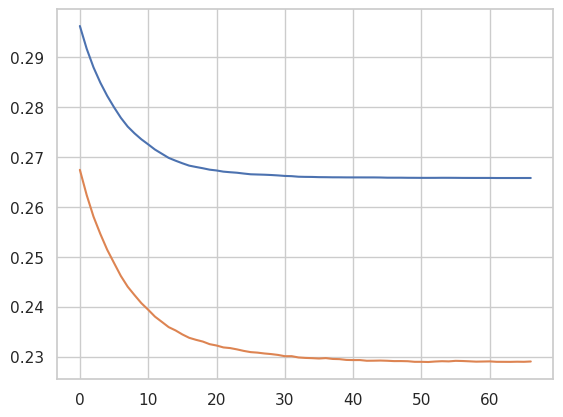

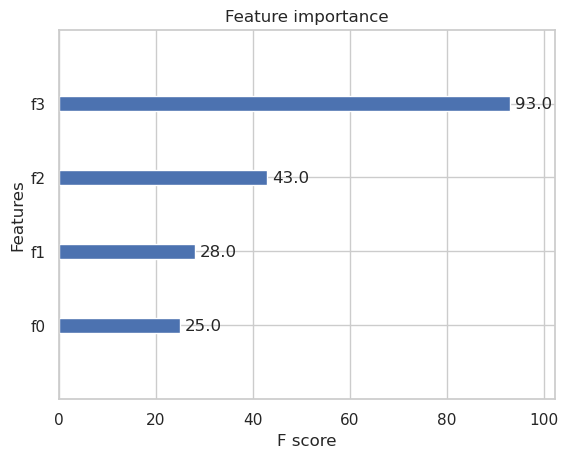

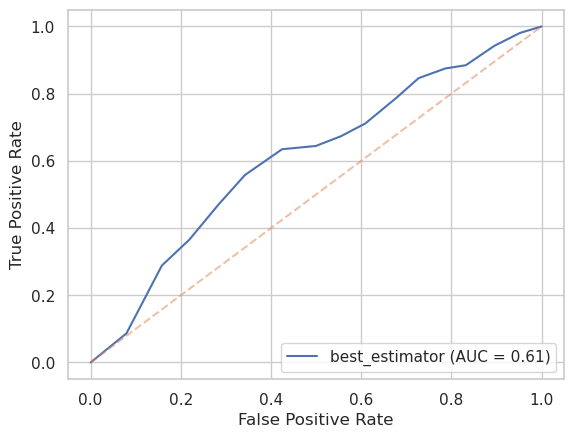

/home/jenny/anaconda3/envs/echain/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/jenny/anaconda3/envs/echain/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/jenny/anaconda3/envs/echain/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/jenny/anaconda3/envs/echain/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea

0.6424744817306453 {'colsample_bytree': 0.75, 'gamma': 0.5, 'learning_rate': 0.05, 'max_depth': 5, 'min_child_weight': 1, 'subsample': 0.75}
0.6578687375832905
0.6390805469204135
0.5890831437352813
0.5890831437352813


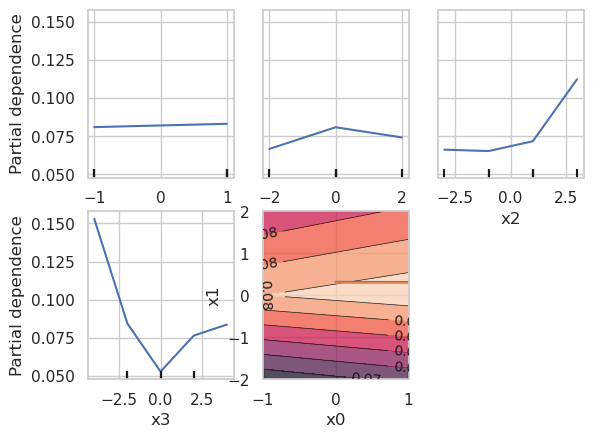

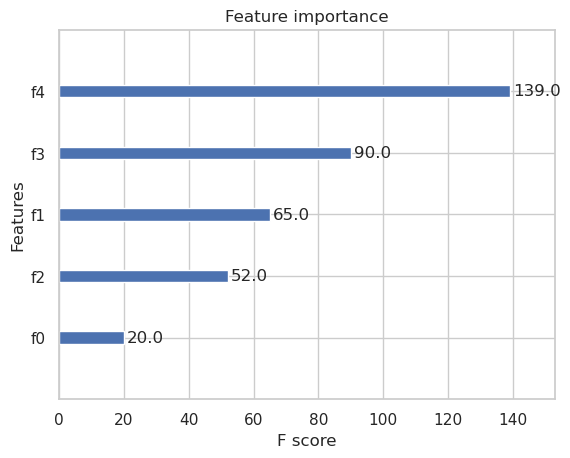

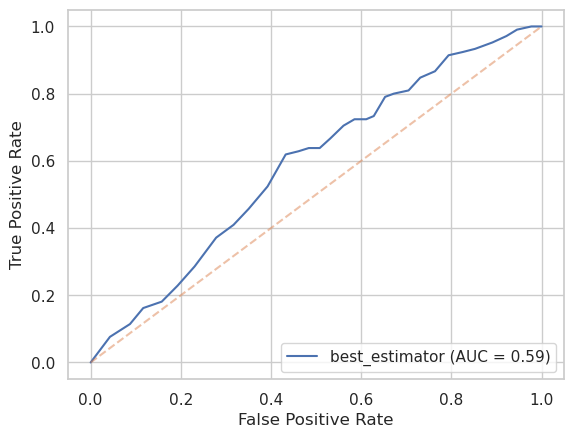

/home/jenny/anaconda3/envs/echain/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/jenny/anaconda3/envs/echain/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/jenny/anaconda3/envs/echain/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/jenny/anaconda3/envs/echain/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea

0.6427792993696617 {'colsample_bytree': 0.75, 'gamma': 0.5, 'learning_rate': 0.0001, 'max_depth': 4, 'min_child_weight': 1, 'subsample': 1}
0.650308070944827
0.6512823511069535
0.6321946740128558
0.6321946740128558


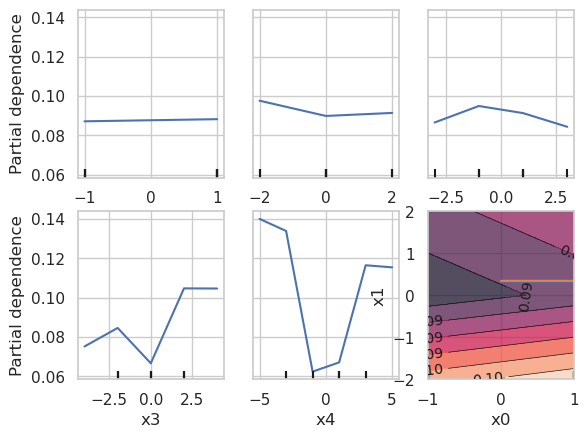

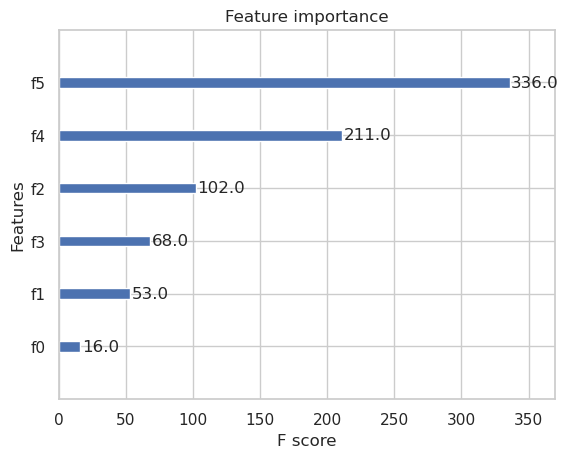

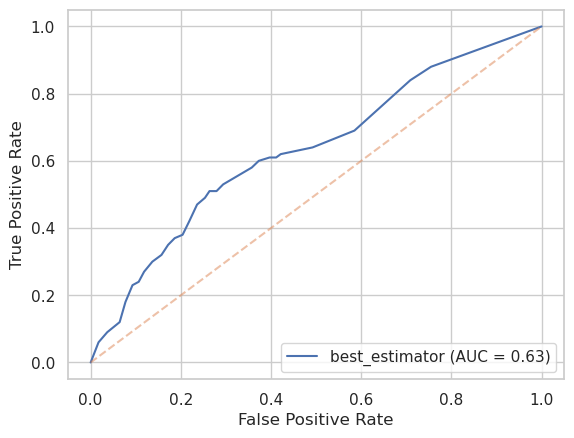

/home/jenny/anaconda3/envs/echain/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/jenny/anaconda3/envs/echain/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/jenny/anaconda3/envs/echain/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/jenny/anaconda3/envs/echain/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea

0.5807541929129645 {'colsample_bytree': 0.75, 'gamma': 0.5, 'learning_rate': 0.1, 'max_depth': 2, 'min_child_weight': 5, 'subsample': 0.75}
0.6209394450406255
0.6799235988838436
0.6333721833721833
0.6333721833721833


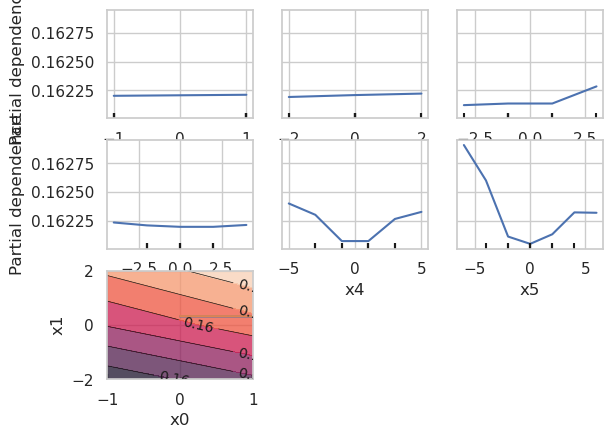

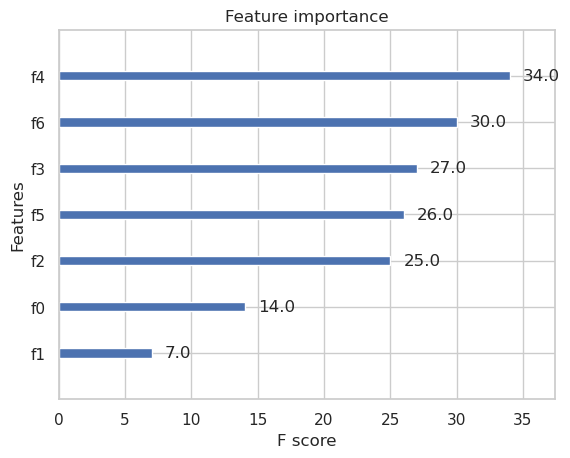

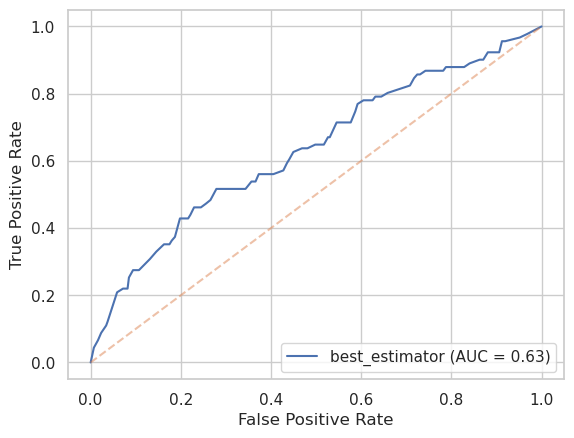

/home/jenny/anaconda3/envs/echain/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/jenny/anaconda3/envs/echain/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/jenny/anaconda3/envs/echain/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/jenny/anaconda3/envs/echain/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea

0.6525915753817113 {'colsample_bytree': 1, 'gamma': 0.5, 'learning_rate': 0.1, 'max_depth': 4, 'min_child_weight': 1, 'subsample': 0.75}
0.7191920786274582
0.6285508347674497
0.6202584871420351
0.6202584871420351


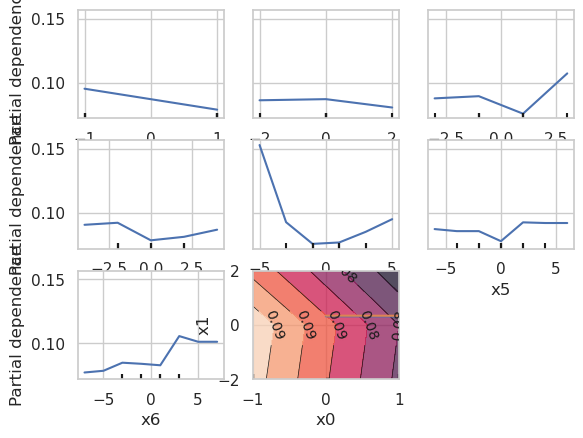

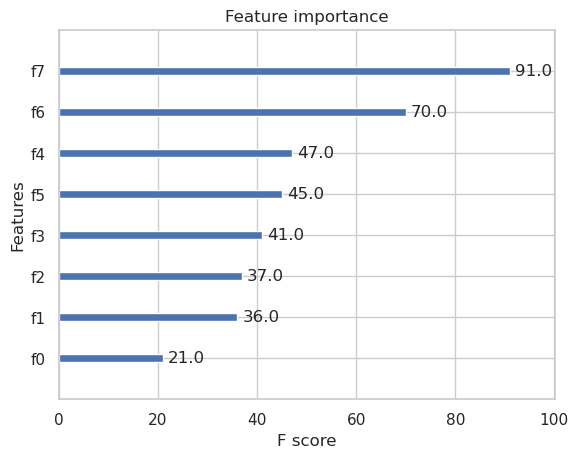

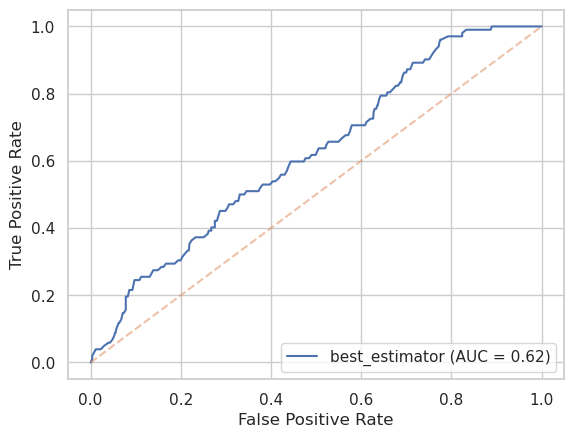

/home/jenny/anaconda3/envs/echain/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/jenny/anaconda3/envs/echain/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
/home/jenny/anaconda3/envs/echain/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/jenny/anaconda3/envs/echain/lib/python3.11/site-packages/xgboost/sklearn.py:889: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-lea

0.5968274915530251 {'colsample_bytree': 0.75, 'gamma': 0.5, 'learning_rate': 0.01, 'max_depth': 5, 'min_child_weight': 5, 'subsample': 0.75}
0.6768803429995824
0.5831688883519257
0.6070219353138793
0.6070219353138793


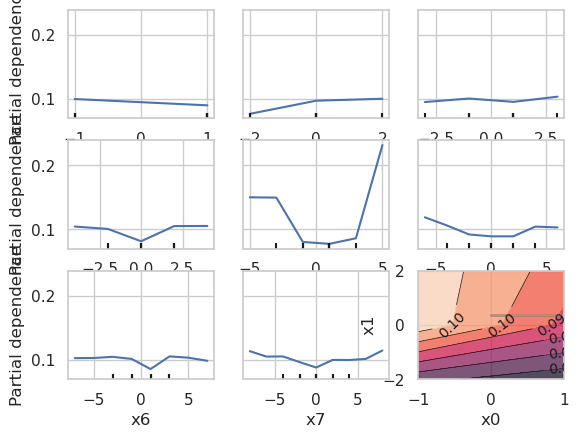

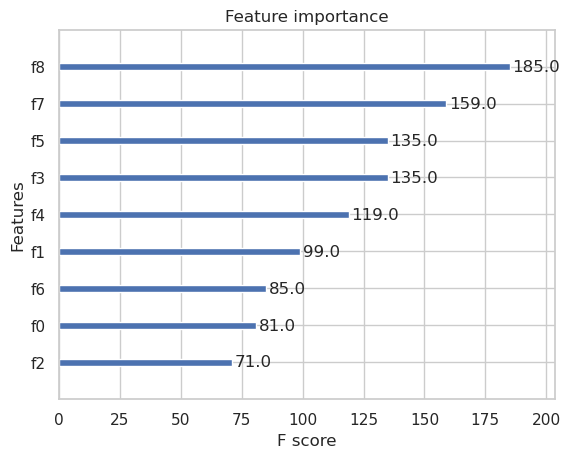

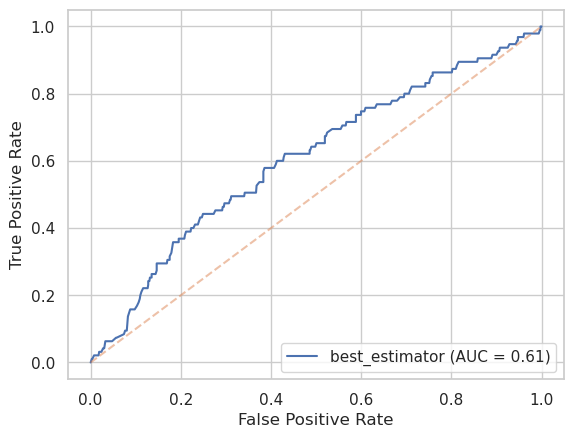

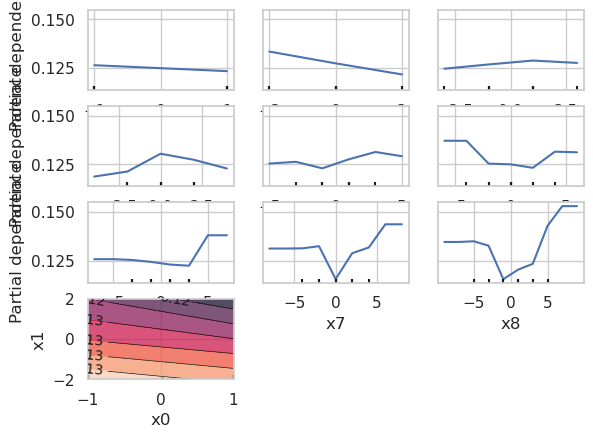

In [22]:
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
import xgboost as xgb

FPR =[]
TPR = []
AUC = [] 
THRESHOLD = []
SIZE = []

for threshold in [4,5,6,7,8,9]:

    # model_type="truth"
    # if model_type ==  "truth":
    #     dataset_resp = dataset.sum(axis=1) >0
    model_type = "continue"
    if model_type == "continue":
        dataset = binary_seq_all[nancount <= 30 - threshold, :]
        dataset_resp = np.isnan(
            dataset[:, threshold]
        )  # True means they stopped, false means they kept going
        dataset = dataset[:, :threshold]
        
        # train test val split
    x_train, x_test, y_train, y_test = train_test_split(
        dataset, dataset_resp, test_size=0.2, random_state=1
    )
    x_train, x_val, y_train, y_val = train_test_split(
        x_train, y_train, test_size=0.25, random_state=1
    )
    # create a dictionary containing the hyperparameters
    # to tune and the range of values to try
    PARAMETERS = {
        "subsample": [0.75, 1],
        "gamma": [0.5, 1.5, 5],
        "colsample_bytree": [0.75, 1],
        "max_depth": [2, 3, 4, 5],
        "min_child_weight": [1, 5],
        #               "tree_method":['gpu_hist'],
        "learning_rate": [0.0001, 0.1, 0.01, 0.05],
    }


    # create a validation set which will be used for early stopping
    eval_set = [(x_val, y_val)]

    # initialise an XGBoost classifier, set the number of estimators,
    # evaluation metric & early stopping rounds
    estimator = xgb.XGBClassifier(
        objective="binary:logistic",
        n_estimators=100,
        seed=42
        #                             tree_method = 'gpu_hist',
        #                              gpu_id =1
    )

    # initialise GridSearchCV model by passing the XGB classifier we
    # initialised in the last step along with the dictionary of parameters
    # and values to try. We also set the number of folds to validate over
    # along with the scoring metic to use
    grid_search = GridSearchCV(
        estimator=estimator,
        param_grid=PARAMETERS,
        cv=7,
        n_jobs=10,
        verbose=0,
        scoring="roc_auc",
        return_train_score=True,
    )
    # fit model
    clf = grid_search.fit(
        x_train,
        y_train,
        eval_set=eval_set,
        eval_metric=["auc"],
        early_stopping_rounds=8,
        verbose=0,
    )

    # print out the best hyperparameters
    print(clf.best_score_, clf.best_params_)

    mymodel = clf.best_estimator_
    eval_set = [(x_train, y_train), (x_val, y_val)]
    mymodel.fit(
        x_train,
        y_train,
        early_stopping_rounds=15,
        eval_metric=["auc", "logloss"],
        eval_set=eval_set,
        verbose=False,
    )
    from sklearn import metrics
    from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

    y_pred_prob_train = mymodel.predict_proba(x_train)
    y_pred_prob_val = mymodel.predict_proba(x_val)

    y_pred_prob_test = mymodel.predict_proba(x_test)

    fpr_train, tpr_train, _ = metrics.roc_curve(y_train, y_pred_prob_train[:, 1])
    fpr_val, tpr_val, _ = metrics.roc_curve(y_val, y_pred_prob_val[:, 1])
    fpr_test, tpr_test, _ = metrics.roc_curve(y_test, y_pred_prob_test[:, 1])
    auc_train = metrics.auc(fpr_train, tpr_train)
    auc_val = metrics.auc(fpr_val, tpr_val)
    auc_test = metrics.auc(fpr_test, tpr_test)
    print(auc_train)

    print(auc_val)
    print(auc_test)
    results = mymodel.evals_result()
    plt.plot(results["validation_0"]["logloss"])
    plt.plot(results["validation_1"]["logloss"])
    x_train.shape
    booster: xgb.Booster = mymodel.get_booster()
    xgb.plot_importance(booster, grid=True, importance_type="weight")
    scores = mymodel.predict_proba(x_test)

    fpr, tpr, thresh = metrics.roc_curve(y_test, scores[:, 1])

    roc_auc = metrics.auc(fpr, tpr)
    print(roc_auc)
    fpr
    display = metrics.RocCurveDisplay(
        fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name="best_estimator"
    )
    display.plot()
    plt.plot(np.linspace(0, 1), np.linspace(0, 1), "--", alpha=0.5)
    plt.show()
    
    features = list(range(0,threshold))
    features.append([0,1])
    
    FPR.append(fpr)
    TPR.append(tpr)
    AUC.append(roc_auc)
    THRESHOLD.append(threshold)
    SIZE.append(len(dataset))
    
    from sklearn.inspection import PartialDependenceDisplay
    PartialDependenceDisplay.from_estimator(clf, x_train, features)
    plt.gca()

In [23]:
np.argmax(AUC)

3

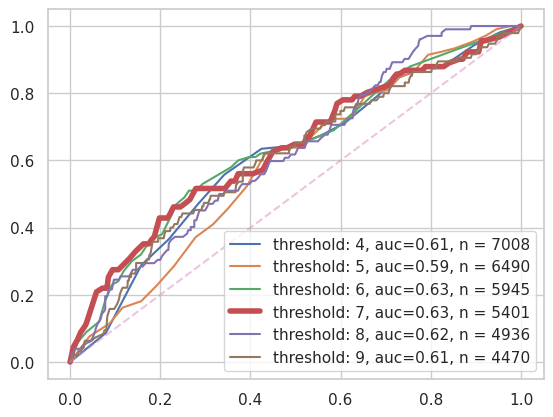

In [24]:

for i in range(len(FPR)):
    if i == np.argmax(AUC):
        plt.plot(FPR[i],TPR[i],label=f'threshold: {str(THRESHOLD[i])}, auc={np.round(AUC[i],2)}, n = {SIZE[i]}', linewidth = 4)
    else:
        plt.plot(FPR[i],TPR[i],label=f'threshold: {str(THRESHOLD[i])}, auc={np.round(AUC[i],2)}, n = {SIZE[i]}')
plt.plot(np.linspace(0, 1), np.linspace(0, 1), "--", alpha=0.5)
# plt.title('AUC Curve for Classifying Termination or Continuition Using Cumsum')
plt.legend()
plt.show()

0.5756004110325575
0.5831688883519257
0.6070219353138793
0.6070219353138793


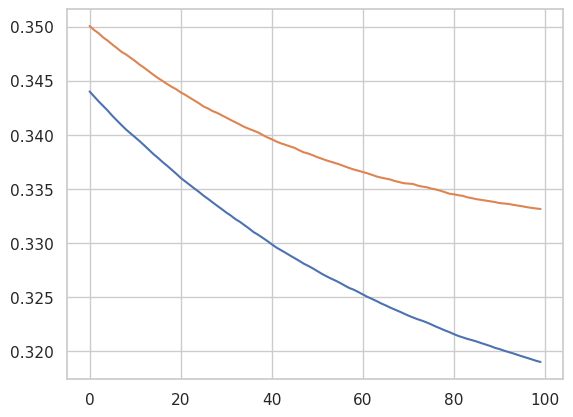

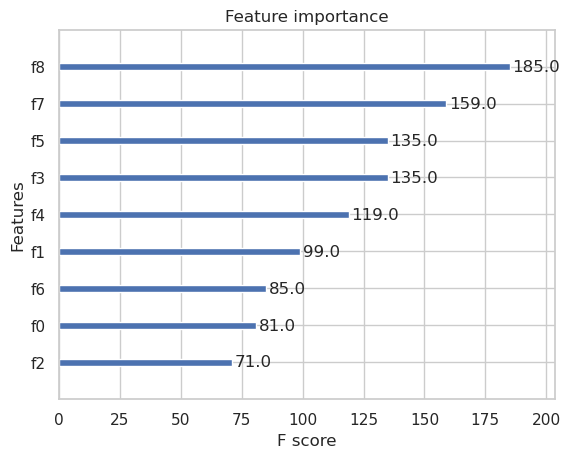

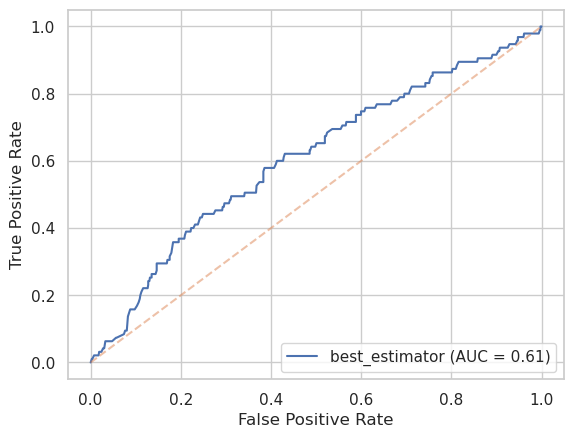

In [39]:
from sklearn.linear_model import LogisticRegression
lr=LogisticRegression()

lr.fit(x_train,y_train)


y_pred_prob_train = lr.predict_proba(x_train)
y_pred_prob_val = lr.predict_proba(x_val)

y_pred_prob_test = lr.predict_proba(x_test)

fpr_train, tpr_train, _ = metrics.roc_curve(y_train, y_pred_prob_train[:, 1])
auc_train = metrics.auc(fpr_train, tpr_train)
auc_val = metrics.auc(fpr_val, tpr_val)
auc_test = metrics.auc(fpr_test, tpr_test)
print(auc_train)

print(auc_val)
print(auc_test)
results = mymodel.evals_result()
plt.plot(results["validation_0"]["logloss"])
plt.plot(results["validation_1"]["logloss"])
x_train.shape
booster: xgb.Booster = mymodel.get_booster()
xgb.plot_importance(booster, grid=True, importance_type="weight")
scores = mymodel.predict_proba(x_test)

fpr, tpr, thresh = metrics.roc_curve(y_test, scores[:, 1])

roc_auc = metrics.auc(fpr, tpr)
print(roc_auc)
fpr
display = metrics.RocCurveDisplay(
    fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name="best_estimator"
)
display.plot()
plt.plot(np.linspace(0, 1), np.linspace(0, 1), "--", alpha=0.5)
plt.show()

In [46]:
lr.coef_

array([[ 0.02301603, -0.24640105,  0.13560546,  0.03432194,  0.10606401,
        -0.14238545, -0.01939887,  0.04156956,  0.04790239]])